# Install Dependencies

In [14]:
!pip install matplotlib
import numpy as np
import skimage as sk
import skimage.io as skio
from skimage import img_as_ubyte
from skimage.transform import rescale
import matplotlib.pyplot as plt
import glob
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/Study/Second Sem/CV2/HW1'
data_dir = f"{path}/coms4732_hw1_data"

Mounted at /content/drive


# Alignment of JPEG Images

In [75]:
def normalize(img: np.ndarray) -> np.ndarray:
        """Scales image to 0-255 range. Essential for 16-bit TIFF vs 8-bit JPG."""
        img_min, img_max = img.min(), img.max()
        if img_max > img_min:
            return ((img - img_min) / (img_max - img_min) * 255).astype(np.uint8)
        return np.zeros_like(img, dtype=np.uint8)

In [76]:
def auto_contrast(img):
    """
    Apply auto-contrast by clipping the 5th and 95th percentiles
    and stretching the result to 0-255.
    """
    result = img.copy()
    if result.ndim == 3:
        for i in range(3):
            low, high = np.percentile(result[...,i], (5, 95))
            if high > low:
                result[...,i] = np.clip((result[...,i].astype(np.float32) - low) / (high - low) * 255, 0, 255)
    else:
        low, high = np.percentile(result, (5, 95))
        if high > low:
             result = np.clip((result.astype(np.float32) - low) / (high - low) * 255, 0, 255)
    return result.astype(np.uint8)

In [77]:
def align(src, ref, max_shift=15):
    """
    Align src channel to ref channel using SSD.
    Searches for the best (x, y) shift within [-max_shift, max_shift] pixels.
    """
    best_score = float('inf')
    best_shift = (0, 0)
    for x_shift in range(-max_shift, max_shift+1):
        for y_shift in range(-max_shift, max_shift+1):
            shifted = np.roll(src, shift=(x_shift, y_shift), axis=(0, 1))
            # Compute SSD only on the central region to avoid edge effects
            ssd = np.sum((ref[max_shift:-max_shift, max_shift:-max_shift] - shifted[max_shift:-max_shift, max_shift:-max_shift]) ** 2)
            if ssd < best_score:
                best_score = ssd
                best_shift = (x_shift, y_shift)
    return best_shift

In [78]:
def crop_percent(im, percent=0.1):
    h, w = im.shape[:2]
    crop_h = int(h * percent)
    crop_w = int(w * percent)
    if im.ndim == 3:
        return im[crop_h:-crop_h, crop_w:-crop_w, :]
    else:
        return im[crop_h:-crop_h, crop_w:-crop_w]

In [79]:
def simple_alignment(imname):
    # read in the image
    im = skio.imread(imname)
    im = sk.img_as_float(im)
    height = np.floor(im.shape[0] / 3.0).astype(int)

    # separate color channels
    b = im[:height]
    g = im[height: 2*height]
    r = im[2*height: 3*height]

    # Crop all channels first
    b_crop = crop_percent(b)
    g_crop = crop_percent(g)
    r_crop = crop_percent(r)

    # Align cropped channels
    shift_g = align(g_crop, b_crop)
    ag = np.roll(g_crop, shift_g, axis=(0, 1))

    shift_r = align(r_crop, b_crop)
    ar = np.roll(r_crop, shift_r, axis=(0, 1))

    # Stack only the cropped and aligned channels
    im_out = np.dstack([ar, ag, b_crop])

    # Optionally crop a bit more to remove any remaining border artifacts
    im_out = crop_percent(im_out, percent=0.05)

    # optional auto-contrast
    # im_out = auto_contrast(im_out)

    # Save and display
    filename = os.path.basename(imname)
    out_dir = os.path.join(path, 'out_path')
    os.makedirs(out_dir, exist_ok=True)
    fname = os.path.join(out_dir, filename)
    skio.imsave(fname, img_as_ubyte(im_out))

    plt.imshow(im_out)
    plt.title(f"Aligned: {filename}")
    plt.axis('off')
    plt.show()

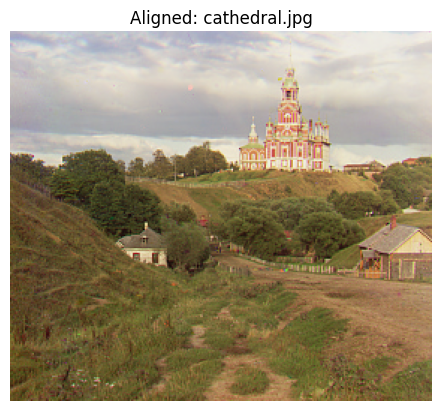

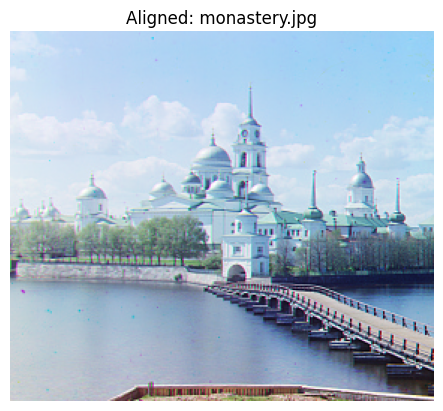

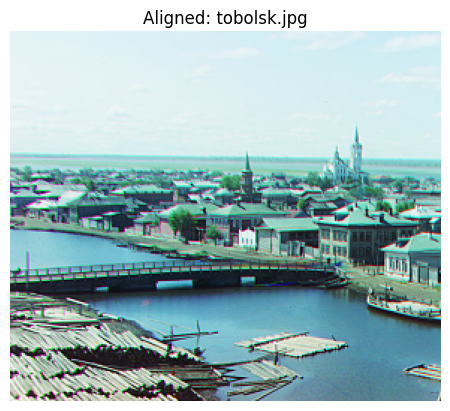

In [80]:
# Get all .jpg files in the directory
jpg_files = glob.glob(os.path.join(data_dir, "*.jpg"))

for imname in jpg_files:
    simple_alignment(imname)

# Alignment of TIF Images

In [81]:
from skimage.filters import sobel

def align_with_edges(src, ref, max_shift=20):
    src_edges = sobel(src)
    ref_edges = sobel(ref)
    return align(src_edges, ref_edges, max_shift)

In [82]:
def align_recursive(src, ref, depth=3):
    """
    Align src to ref using a pyramid approach with recursion.
    """
    if depth == 0 or min(src.shape) < 200:
        # Base case: use the standard alignment with a default window
        return align(src, ref, max_shift=10)

    # Downsample the images by half
    src_small = rescale(src, 0.5, channel_axis=None, anti_aliasing=True)
    ref_small = rescale(ref, 0.5, channel_axis=None, anti_aliasing=True)

    # Recursively find the shift at the coarser scale
    shift_small = align_recursive(src_small, ref_small, depth - 1)

    # Upsample the shift (multiply by 2)
    shift_coarse = (shift_small[0] * 2, shift_small[1] * 2)

    # Apply the coarse shift to the source image
    src_shifted = np.roll(src, shift=shift_coarse, axis=(0, 1))

    # Refine the alignment at the current scale with a smaller search window
    refinement = align(src_shifted, ref, max_shift=2)

    # Combine the shifts
    total_shift = (shift_coarse[0] + refinement[0], shift_coarse[1] + refinement[1])
    return total_shift

In [83]:
def process_tif(imname):
    print(f"Processing {os.path.basename(imname)}...")
    # Read image
    im = skio.imread(imname)
    im = sk.img_as_float(im)
    im = normalize(im)

    # Split channels (use integer division to avoid partial rows)
    height = im.shape[0] // 3
    b = im[:height]
    g = im[height: 2*height]
    r = im[2*height: 3*height]

    # Crop copies for robust shift estimation
    b_crop = crop_percent(b)
    g_crop = crop_percent(g)
    r_crop = crop_percent(r)

    # Compute Sobel edges on the cropped images for alignment (robust to low-texture regions)
    b_edges = sobel(b_crop)
    g_edges = sobel(g_crop)
    r_edges = sobel(r_crop)

    # Align using edge images with pyramid recursion (shifts are pixel-wise)
    shift_g = align_recursive(g_edges, b_edges, depth=4)
    shift_r = align_recursive(r_edges, b_edges, depth=4)

    print(f"  Green shift: {shift_g}")
    print(f"  Red shift: {shift_r}")

    # Apply computed shifts to the ORIGINAL full-size channel slices (keeps output original size)
    ag = np.roll(g, shift_g, axis=(0, 1))
    ar = np.roll(r, shift_r, axis=(0, 1))

    # Stack aligned full-size channels with the original blue channel
    im_out = np.dstack([ar, ag, b])

    # small crop to remove border artifacts if needed
    im_out = crop_percent(im_out, percent=0.07)

    # optional auto-contrast
    # im_out = auto_contrast(im_out)

    # Save the result
    filename = os.path.basename(imname)
    out_dir = os.path.join(path, 'out_path')
    os.makedirs(out_dir, exist_ok=True)
    fname = os.path.join(out_dir, filename.replace('.tif', '_aligned.png'))
    skio.imsave(fname, img_as_ubyte(im_out))

    plt.figure(figsize=(10, 10))
    plt.imshow(im_out)
    plt.title(f"Aligned: {filename}")
    plt.axis('off')
    plt.show()

Processing harvesters.tif...
  Green shift: (60, 17)
  Red shift: (124, 14)


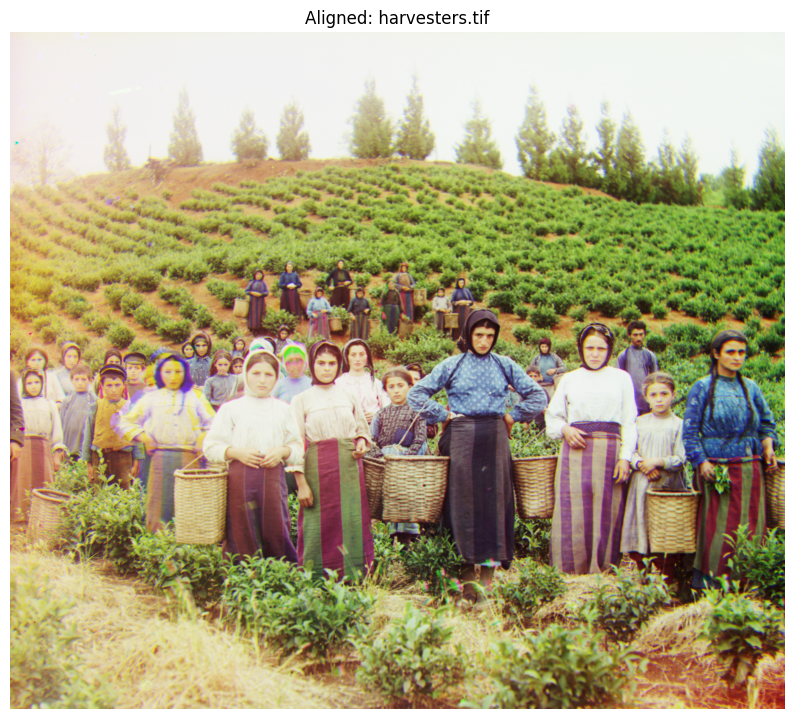

Processing emir.tif...
  Green shift: (49, 24)
  Red shift: (107, 40)


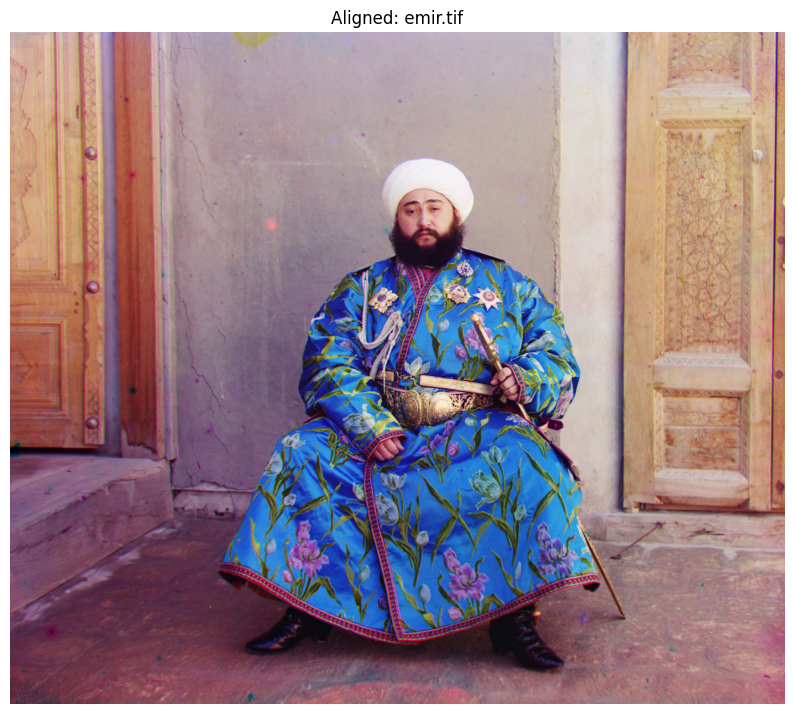

Processing church.tif...
  Green shift: (25, 4)
  Red shift: (58, -4)


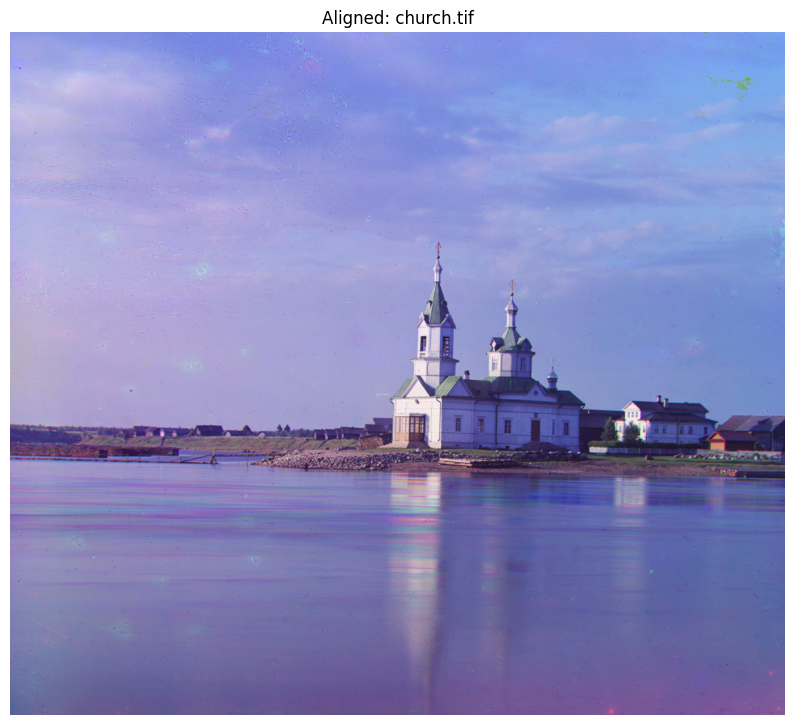

Processing italil.tif...
  Green shift: (38, 22)
  Red shift: (77, 36)


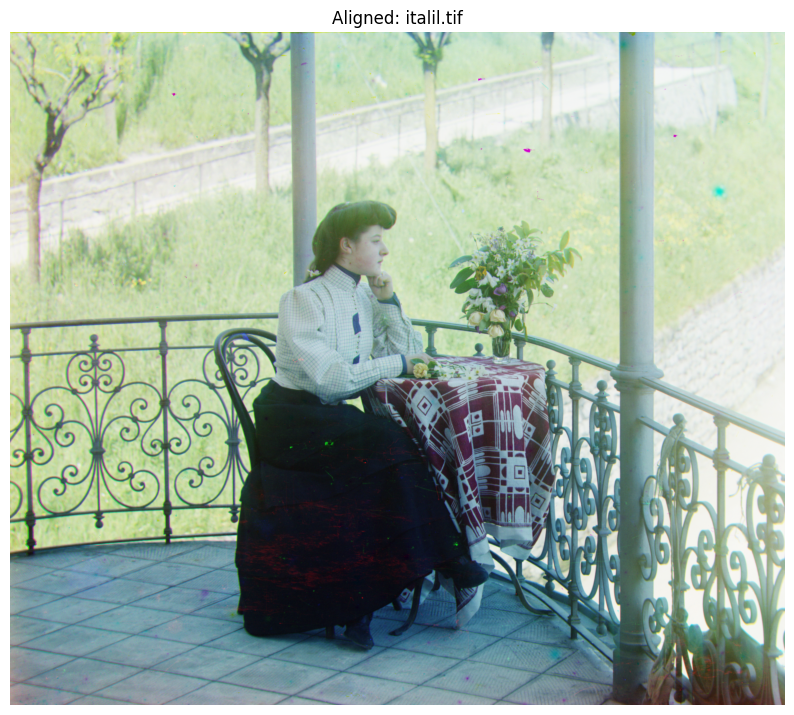

Processing icon.tif...
  Green shift: (42, 17)
  Red shift: (90, 23)


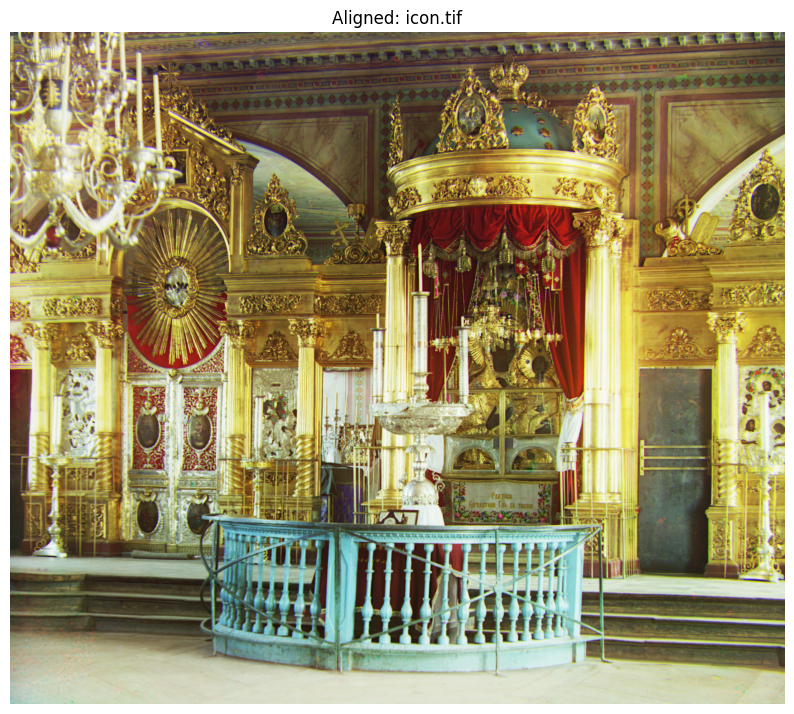

Processing self_portrait.tif...
  Green shift: (78, 29)
  Red shift: (176, 37)


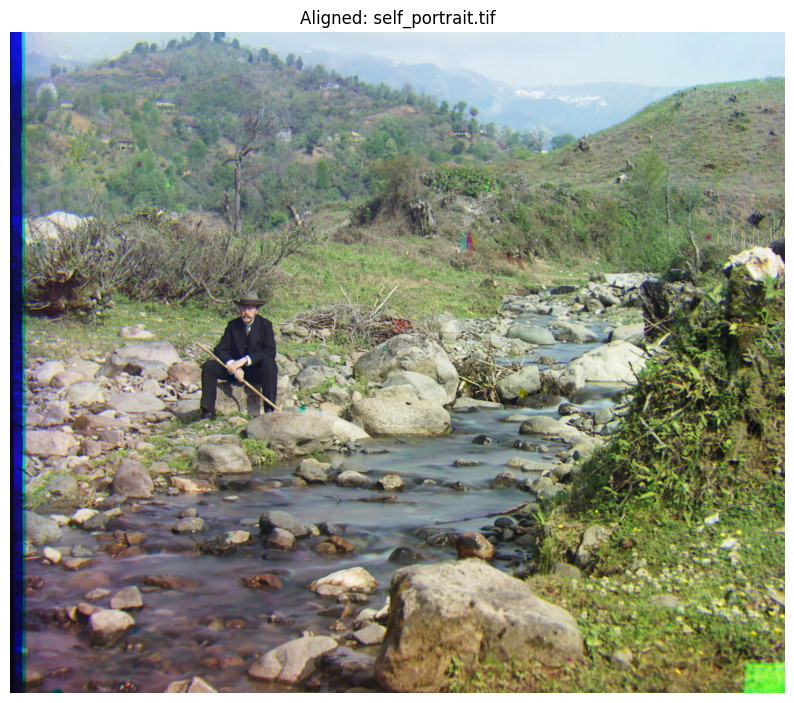

Processing siren.tif...
  Green shift: (49, -6)
  Red shift: (96, -24)


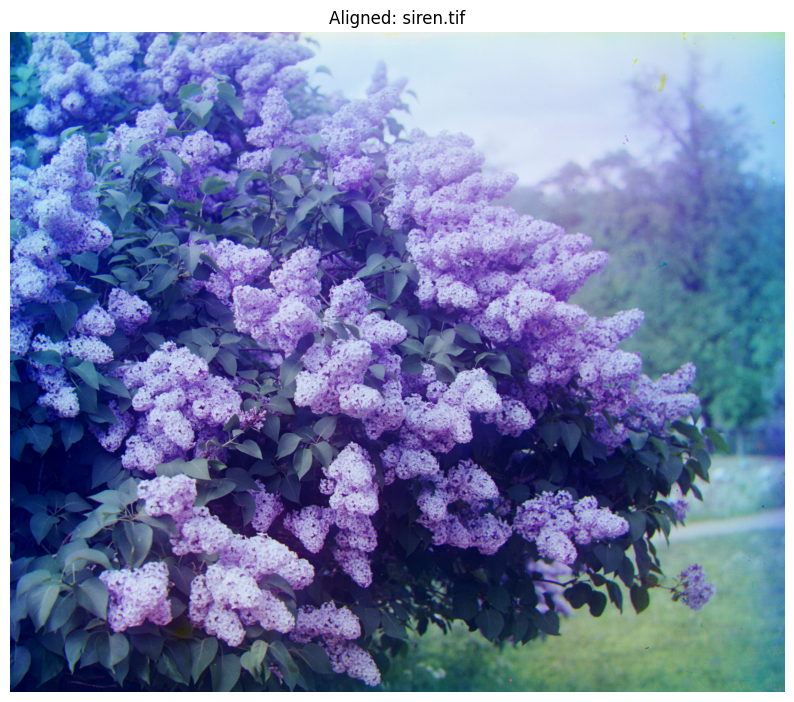

Processing melons.tif...
  Green shift: (80, 10)
  Red shift: (177, 13)


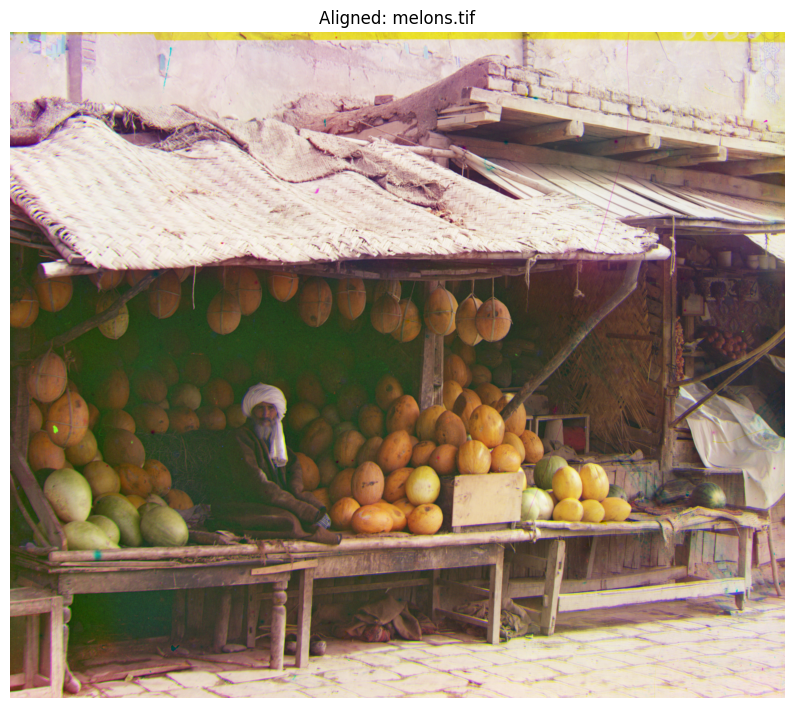

Processing lugano.tif...
  Green shift: (41, -17)
  Red shift: (92, -29)


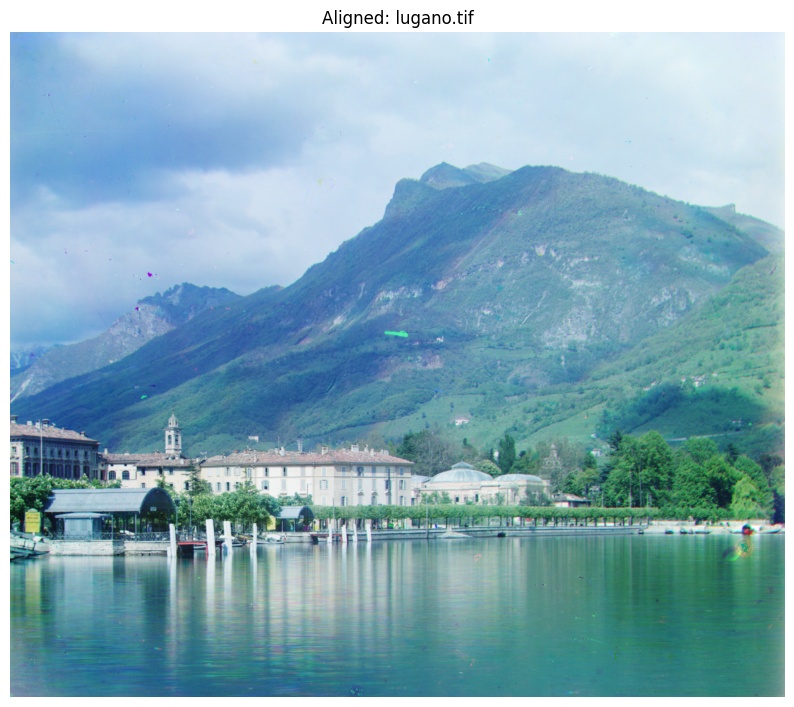

Processing lastochikino.tif...
  Green shift: (-3, -2)
  Red shift: (76, -8)


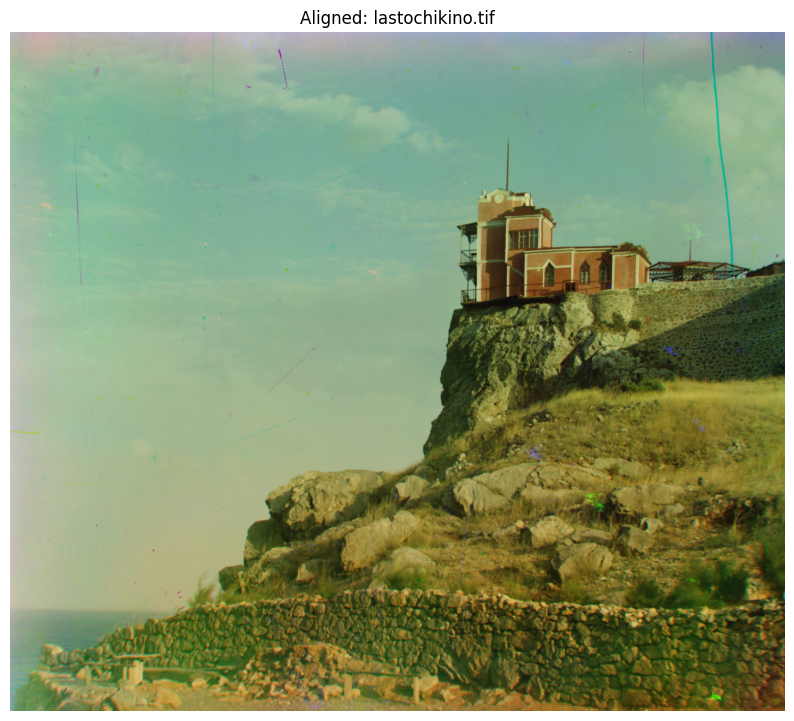

Processing three_generations.tif...
  Green shift: (54, 12)
  Red shift: (111, 9)


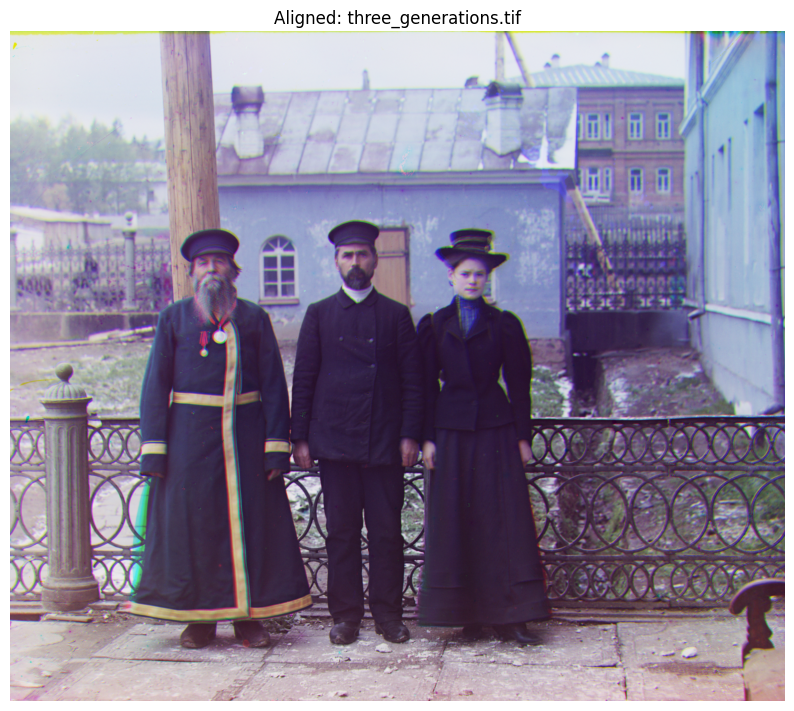

In [84]:
# Get all .tif files and process them
tif_files = glob.glob(os.path.join(data_dir, "*.tif"))

for imname in tif_files:
    process_tif(imname)